In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv('Real_Combine.csv')

In [3]:
df=df.dropna()

In [4]:
X=df.iloc[:,:-1] ## independent features
y=df.iloc[:,-1] ## dependent features

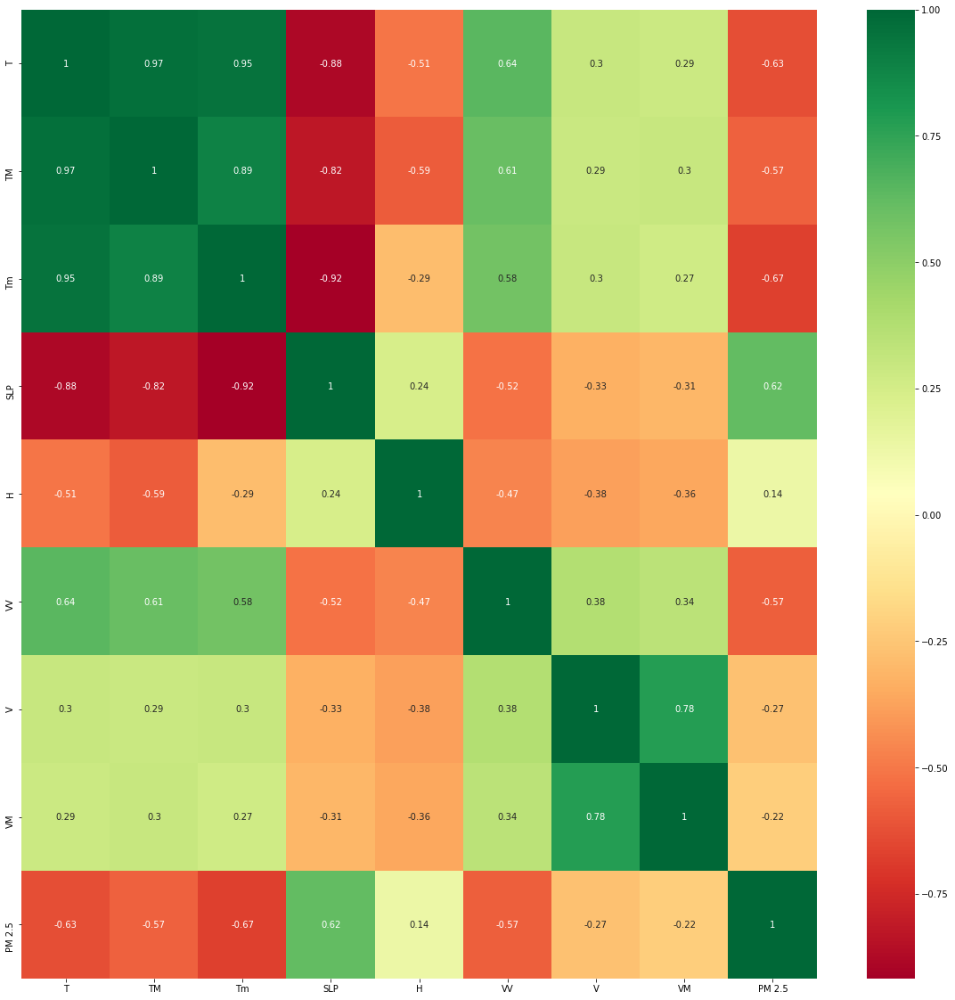

In [5]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [6]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [7]:
X.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [8]:
print(model.feature_importances_)

[0.19704363 0.09139522 0.18538909 0.1503554  0.08672712 0.19257227
 0.05289269 0.04362458]


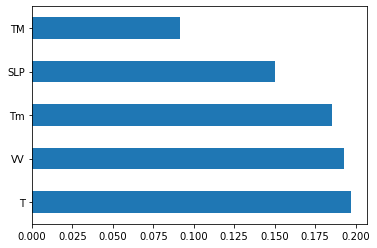

In [9]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

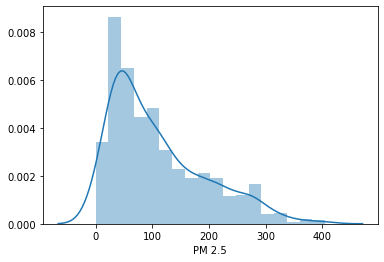

In [10]:
sns.distplot(y)

In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [12]:
from sklearn.tree import DecisionTreeRegressor

In [13]:
dtree=DecisionTreeRegressor(criterion="%mse")

In [14]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [15]:
print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [16]:
print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on test set: 0.6764411734381977


In [17]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)

In [18]:
score.mean()

0.5359545121876097

In [20]:
##conda install pydotplus
## conda install python-graphviz

from IPython.display import Image  
#from sklearn.externals.six import StringIO
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [21]:
df.columns

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

In [22]:
df.columns[:-1]

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM'], dtype='object')

In [23]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [24]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [25]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.944593 to fit



In [26]:
prediction=dtree.predict(X_test)

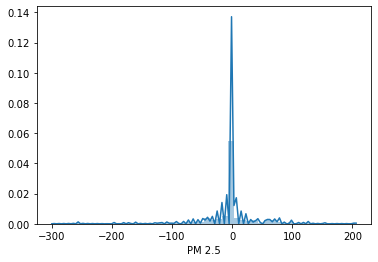

In [27]:
sns.distplot(y_test-prediction)

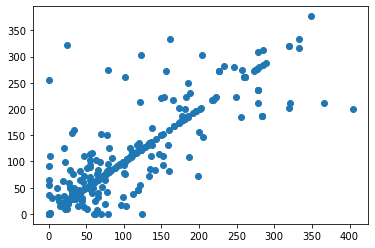

In [28]:
plt.scatter(y_test,prediction)

In [29]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [30]:

## Hyper Parameter Optimization

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}

In [31]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [32]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [33]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [34]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 1048 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 3608 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done 7192 tasks      | elapsed:   31.7s
[Parallel(n_jobs=-1)]: Done 11800 tasks      | elapsed:   48.3s
[Parallel(n_jobs=-1)]: Done 17432 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 24088 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 31768 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 40472 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 50200 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 60952 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 72728 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 85528 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 99352 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 10240


 Time taken: 0 hours 5 minutes and 58.49 seconds.


In [35]:
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X_train,y_train)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1528 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 4088 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 7672 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 12280 tasks      | elapsed:   41.4s
[Parallel(n_jobs=-1)]: Done 17912 tasks      | elapsed:   59.4s
[Parallel(n_jobs=-1)]: Done 24568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 32248 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 40952 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 50680 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 61432 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 73208 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 86008 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 99832 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 10240


 Time taken: 0 hours 5 minutes and 18.96 seconds.


In [36]:
random_search.best_params_

{'max_depth': 3,
 'max_features': 'auto',
 'max_leaf_nodes': 30,
 'min_samples_leaf': 2,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [37]:
random_search.best_score_

-2900.6707747920436

In [38]:
predictions=random_search.predict(X_test)

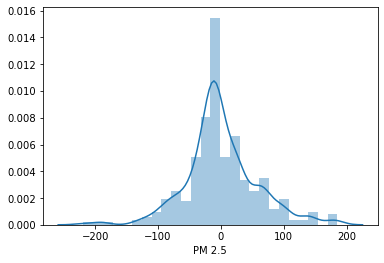

In [40]:
sns.distplot(y_test-predictions)

In [42]:
from sklearn import metrics

In [43]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 41.38807833610589
MSE: 3302.3678597157123
RMSE: 57.46623234313967


In [44]:
import pickle 

In [ ]:
# open a file, where you ant to store the data
file = open('decision_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(random_search, file)